# Welcome to the In Silico Framework (ISF)

ISF is a multi-scale simulation environment for the generation, simulation, and analysis of neurobiologically tractable single cell and network-level simulations.

![](../../docs/_static/_images/organigram_v6.png)

## Packages in ISF

### Packages in this repository you will most likely directly interact with

| Module |Description                                                                                                                                                                                                                                                                                                                                                                                                                                                                 |
|---------------------------|--------------------------------------------|
| `singlecell_input_mapper`| Module for generating anatomical models, i.e. determining number and location of synapses and number and location of presynaptic cells                                                                                                                                                                                                                                                                                                                                       |
| `single_cell_parser`| High level interface to the NEURON simulator providing methods to perform single cell simulations with synaptic input. The anatomical constraints of the synaptic input are provided by the single_cell_input_mapper module.                                                                                                                                                                                                                                                |
| `simrun`| High level interface to the single_cell_parser module providing methods for common simulation tasks. It also provides methods for building reduced models mimicing the full compartmental model.                                                                                                                                                                                                                                                                             |
| `data_base`| Flexible database whose API mimics a python dictionary. It provides efficient and scalable methods to store and access simulation results at a terrabyte scale. It also generates metadata, indicating when the data was put in the database and the exact version of the in_silico_framework that was used at this timepoint. Simulation results from the single_cell_parser module can be imported and converted to a high performance binary format. |

### How should I interact with these packages?

The recommended way is to use the `Interface` module which provides the API necessary to perform simulation tasks.

In [1]:
import Interface as I

[INFO] ISF: Current version: heads/tutorials+0.g2c5677a12.dirty
[INFO] ISF: Current pid: 1788200


--No graphics will be displayed.


[INFO] mechanisms: Loaded mechanisms in NEURON namespace.
[ATTENTION] ISF: The source folder has uncommited changes!



[INFO] ISF: Loaded modules with __version__ attribute are:
IPython: 8.18.1, Interface: heads/tutorials+0.g2c5677a12.dirty, PIL: 11.3.0, _brotli: 1.1.0, _csv: 1.0, _ctypes: 1.1.0, _curses: b'2.2', _decimal: 1.70, argparse: 1.1, blosc: 1.11.3, bluepyopt: 1.9.126, brotli: 1.1.0, certifi: 2025.08.03, charset_normalizer: 3.4.3, click: 7.1.2, cloudpickle: 3.1.1, colorama: 0.4.6, comm: 0.2.3, csv: 1.0, ctypes: 1.1.0, cycler: 0.12.1, cytoolz: 1.0.1, dash: 2.18.2, dask: 2.30.0, dateutil: 2.9.0.post0, deap: 1.4, debugpy: 1.8.16, decimal: 1.70, decorator: 5.2.1, defusedxml: 0.7.1, distributed: 2.30.0, distutils: 3.9.23, entrypoints: 0.4, exceptiongroup: 1.3.0, executing: 2.2.0, fasteners: 0.17.3, flask: 1.1.4, fsspec: 2025.7.0, future: 1.0.0, greenlet: 3.2.4, idna: 3.10, ipaddress: 1.0, ipykernel: 6.29.5, ipywidgets: 8.1.7, isf_pandas_msgpack: 0.4.0, itsdangerous: 1.1.0, jedi: 0

Now, you can access top-level API directly:

In [2]:
I.scp # single_cell_parser package
I.sca # single_cell_analyzer package
I.DataBase # main class of isf_data_base
I.map_singlecell_inputs # compute anatomical model for a given cell morphology in barrel cortex 
I.simrun_run_new_simulations # default function for running single cell simulations with well constrained synaptic input
I.db_init_simrun_general.init # default method to initialize a model data base with existing simulation results
I.db_init_simrun_general.optimize # converts the data to speed optimized compressed binary format
I.synapse_activation_binning_dask # parallelized binning of synapse activation data
I.rm_get_kernel # create reduced lda model from simulation data

<module 'simrun.reduced_model.get_kernel' from '/gpfs/soma_fs/scratch/meulemeester/project_src/in_silico_framework/simrun/reduced_model/get_kernel.py'>

Use autocompletion of IPython to find the other modules. 
To quickly inspect the documentation from within the IPython or Jupyter session, use a questionmark:

In [3]:
I.db_init_simrun_general.init?

Signature:
I.db_init_simrun_general.init(
    db,
    simresult_path,
    core=True,
    synapse_activation=True,
    dendritic_voltage_traces=True,
    parameterfiles=True,
    spike_times=True,
    repartition=True,
    scheduler=None,
    rewrite_in_optimized_format=True,
    dendritic_spike_times=True,
    dendritic_spike_times_threshold=-30.0,
    client=None,
    check_health=False,
    n_chunks=5000,
    paramfile_copy_config=None,
    voltage_traces=None,
    burst_times=None,
    dumper=None,
)
Docstring:
Initialize a database with simulation data.

Use this function to load simulation data generated with the simrun module
into a :class:`~data_base.DataBase`. 

Most configuration options you would want to change on a init-by-init basis are given here as keyword arguments.
Additional options can be configured in :mod:`data_base.db_initializers.load_simrun_general.config`

Args:
    db (:class:`~data_base.DataBase`):
        The database to store the simulation results in.
    c

## Example simulation

As an example to showcase what ISF can do, we will:
1. Simulate a reconstructed neuron morphology with known [neuron parameters](https://mpinb.github.io/in_silico_framework/file_formats.html#cell-parameters)<br>
    - ... to _in vivo_ like synaptic input conditions defined in [network parameters](https://mpinb.github.io/in_silico_framework/file_formats.html#network-parameters)<br>
    - ... parallellized using a scheduler, to highlight ISF's parallellization and HPC capabilities<br>
    - ... and save the results to a [DataBase](../../api_reference/data_base//index.rst)<br>
2. Parse the simulation data to an optimized format, to highlight the capabilities of the [DataBase](../../api_reference/data_base//index.rst) package
3. Visualize the simulation using the [visualize](../../api_reference/visualize//index.rst) package

How to build and interact with these parameters will be covered in the next tutorials.

### 1. Simulating a neuron model under _in vivo_ synaptic input conditions

In [4]:
from pathlib import Path
from getting_started import getting_started_dir

tutorial_output_dir = f"{Path.home()}/isf_tutorial_output"  # <-- Change this to your desired output directory
parent_db = I.DataBase(tutorial_output_dir)
db = parent_db.create_sub_db("intro_to_isf")
# Create new folder for results
db.create_managed_folder('simrun', raise_ = False)
raw_sim_output_dirname = db['simrun'].join('example')

example_data_dir = Path(getting_started_dir) / "example_data"
neuron_param = I.scp.build_parameters(example_data_dir / 'biophysical_constraints' / '86_C2_center.param')
network_param = I.scp.build_parameters(example_data_dir / 'functional_constraints' / 'network.param')

[WARNING] isf_data_base: ISF has uncommitted changes - reproducing results may not be possible.
[WARNING] isf_data_base: ISF has uncommitted changes - reproducing results may not be possible.
[WARNING] isf_data_base: ISF has uncommitted changes - reproducing results may not be possible.


[WARNING] client: Connection dropped: socket connection broken
[WARNING] client: Transition to CONNECTING
[WARNING] client: Session has expired


In [5]:
nSweeps = 1     # number of consecutive simulation trials per process
nprocs = 1      # number of processes simulating that task in parallel
tStop = 300     # stop the simulation at 300ms

d = I.simrun_run_new_simulations(
    neuron_param,
    network_param, 
    dirPrefix = raw_sim_output_dirname,
    nSweeps = nSweeps, 
    nprocs = nprocs, 
    tStop = tStop, 
    silent = False
)

We now have a list of delayed functions. These contain the instructions to run the simulation, but ar enot yet executed.
We can use these delayed functions to organize the parallellization of the execution.
A common way of running these in parallel is to launch a dask scheduler on some remote machine that has enough CPU power, and pass these delayed functions to that scheduler.
This can be done using the dask Client. The Client is your contact point to the remote scheduler.

In [6]:
dask_client = I.get_client()

In [7]:
# execute the delayed function on the remote scheduler, save the progress as a variable
pending_results = dask_client.compute([d])

You can use dask's dashboard to inspect the progress:

In [8]:
dask_client

Client Scheduler: tcp://10.100.2.217:38786 Dashboard: http://10.100.2.217:38787/status,Cluster Workers: 8 Cores: 8 Memory: 128.85 GB


In [9]:
from dask.distributed import wait
wait(pending_results)  # wait until simulations are done before continuing

DoneAndNotDoneFutures(done={<Future: finished, type: builtins.list, key: list-4b1fe0c9-1b99-404a-bf37-0a8c7629c175>}, not_done=set())

The example above only had a single pair of neuron and network parameters, and only a single simulation run for those parameters. For most use cases, you will likely want to change those parameters and run multiple simulations per parameter set to capture biological variability. For example:
- Different network parameters capture different synapse locations and activations on the neuron model
- Different neuron parameters capture different morphologies and biophysical properties of the neuron model
- Multiple simulation runs capture the trial-to-trial variability, sampling the stochasticity of some parameters like synapse activation probabilities

### 2. Parsing simulation data

Simulation output is written out in simple `.csv` format. This is very useful for simulations in the exploratory stage. However, for high-performant large-scale simulations that are intended to extensively explore biological diversity, you probably want something more performant that ASCII ``csv``.

For this purpose, the [data_base](../../api_reference/data_base//index.rst) package provides data parsers that aggregate raw ``csv`` output from these simulations that convert them to an optimized format (currently this is ``msgpack`` with blosc compression)

In [13]:
I.db_init_simrun_general.init(
    db=db,
    simresult_path=raw_sim_output_dirname,
    client=dask_client,
    paramfile_copy_config={"copy_method": "hash_rename"}  # rename parameterfiles to a hash - useful when running only a single simulation
)

[WARNING] isf_data_base: ISF has uncommitted changes - reproducing results may not be possible.
[WARNING] isf_data_base: ISF has uncommitted changes - reproducing results may not be possible.
[WARNING] isf_data_base: ISF has uncommitted changes - reproducing results may not be possible.
[WARNING] isf_data_base: ISF has uncommitted changes - reproducing results may not be possible.
[WARNING] isf_data_base: ISF has uncommitted changes - reproducing results may not be possible.
[WARNING] isf_data_base: ISF has uncommitted changes - reproducing results may not be possible.
[WARNING] isf_data_base: ISF has uncommitted changes - reproducing results may not be possible.
[WARNING] isf_data_base: ISF has uncommitted changes - reproducing results may not be possible.
[WARNING] isf_data_base: ISF has uncommitted changes - reproducing results may not be possible.


We can inspect what's in the database:

In [14]:
db

[WARNING] isf_data_base: ISF has uncommitted changes - reproducing results may not be possible.
[WARNING] isf_data_base: ISF has uncommitted changes - reproducing results may not be possible.


Located at /gpfs/soma_fs/home/meulemeester/isf_tutorial_output/intro_to_isf/db
db
├── cell_activation
├── voltage_traces
├── simresult_path
├── metadata
├── parameterfiles
├── filelist
├── spike_times
├── simrun
├── dendritic_spike_times
│   └── 000_-30.0
├── dendritic_recordings
│   └── 000
├── synapse_activation
├── parameterfiles_folder
└── sim_trial_index

### 3. Visualizing the simulation

We can create a `Cell` object from each simulation trial: a dataclass containing the simulation results.

In [15]:
cell = I.simrun_simtrial_to_cell_object(
    db, 
    sim_trial_index = db['sim_trial_index'][0]
)


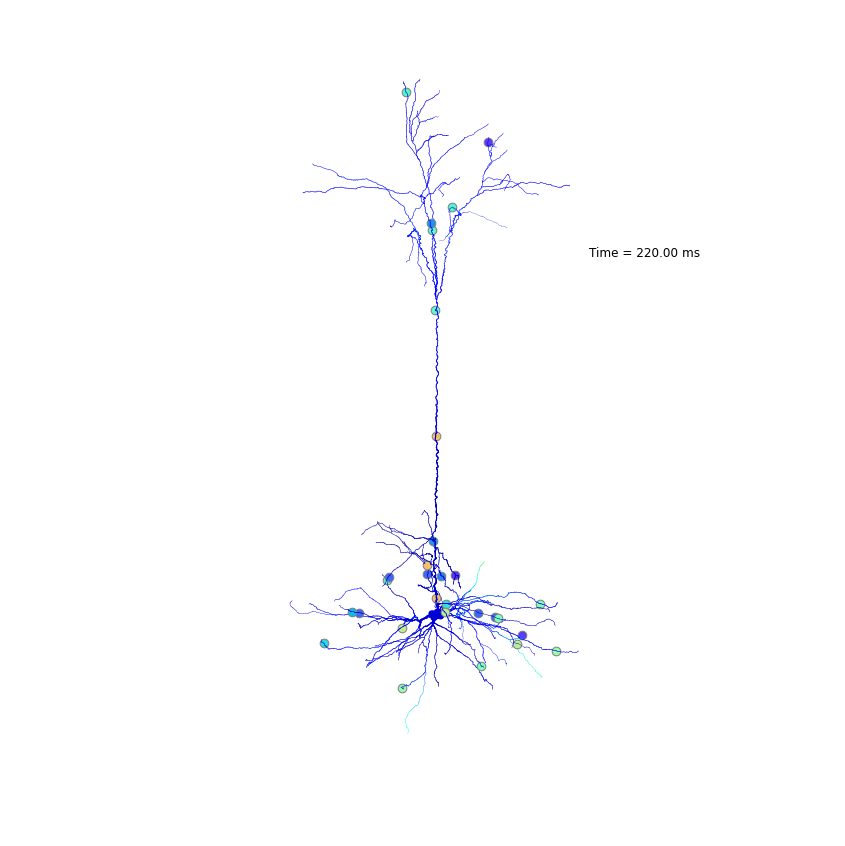
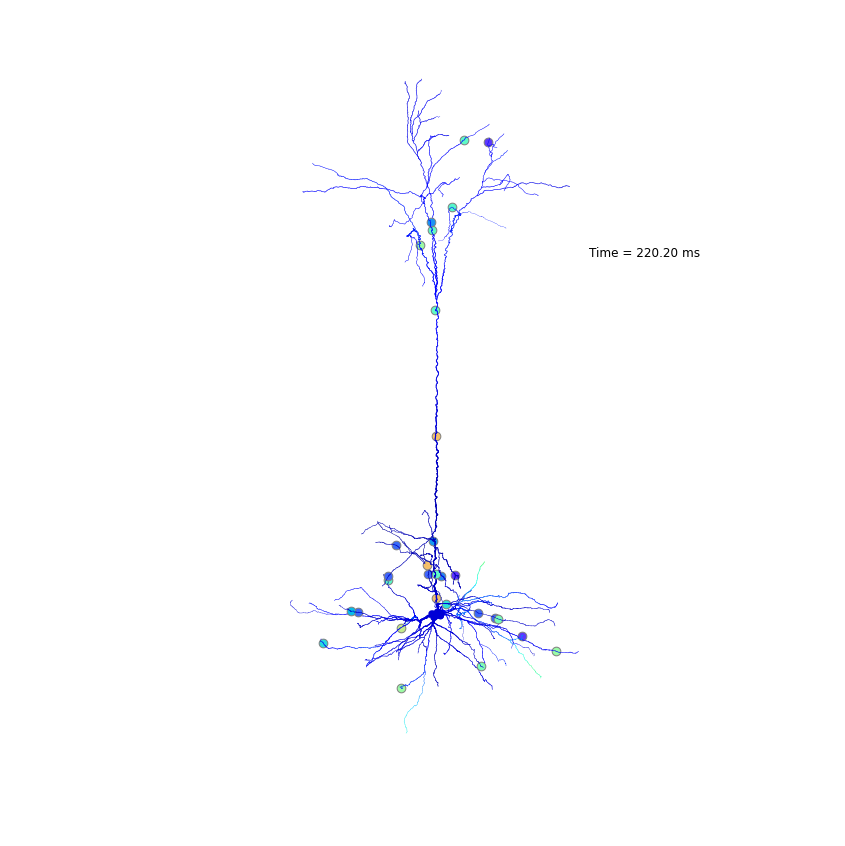
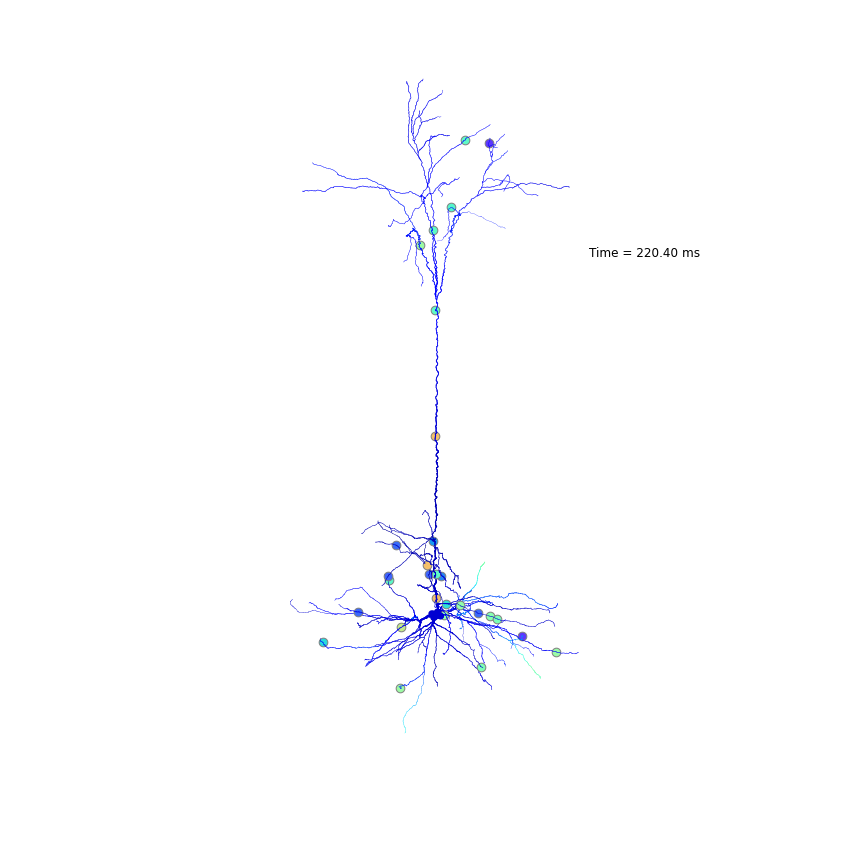
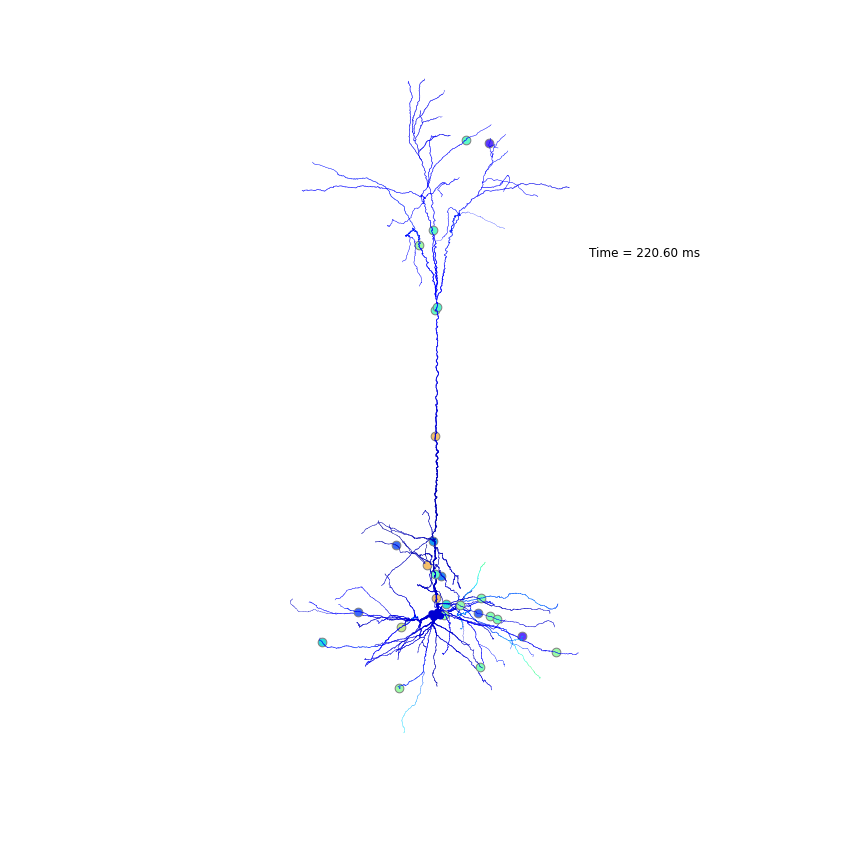
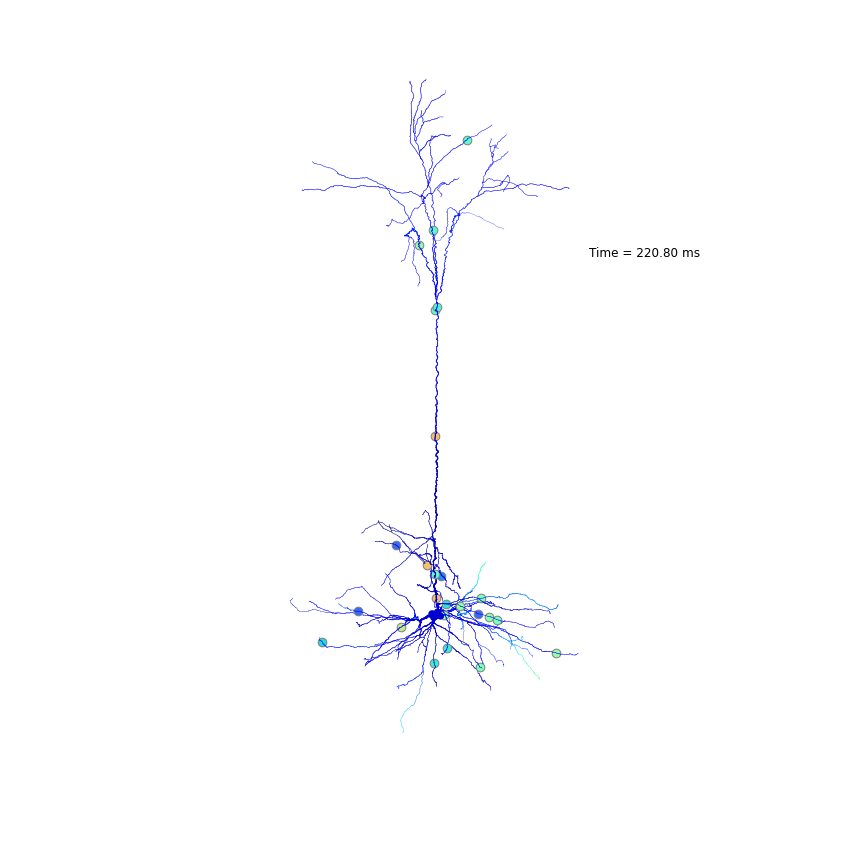
...
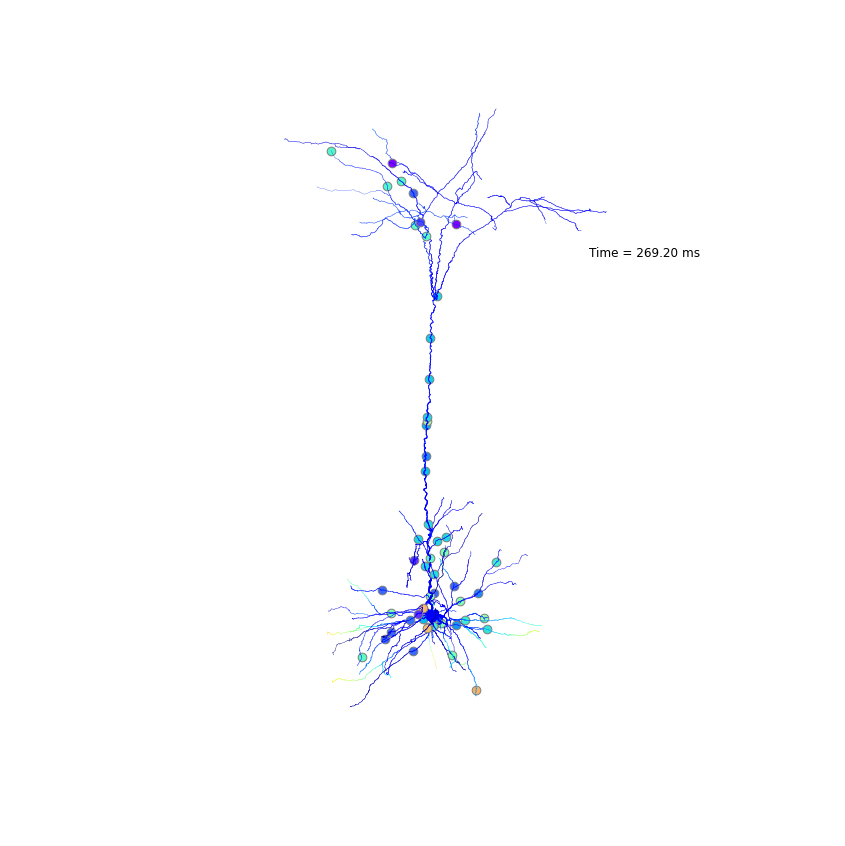
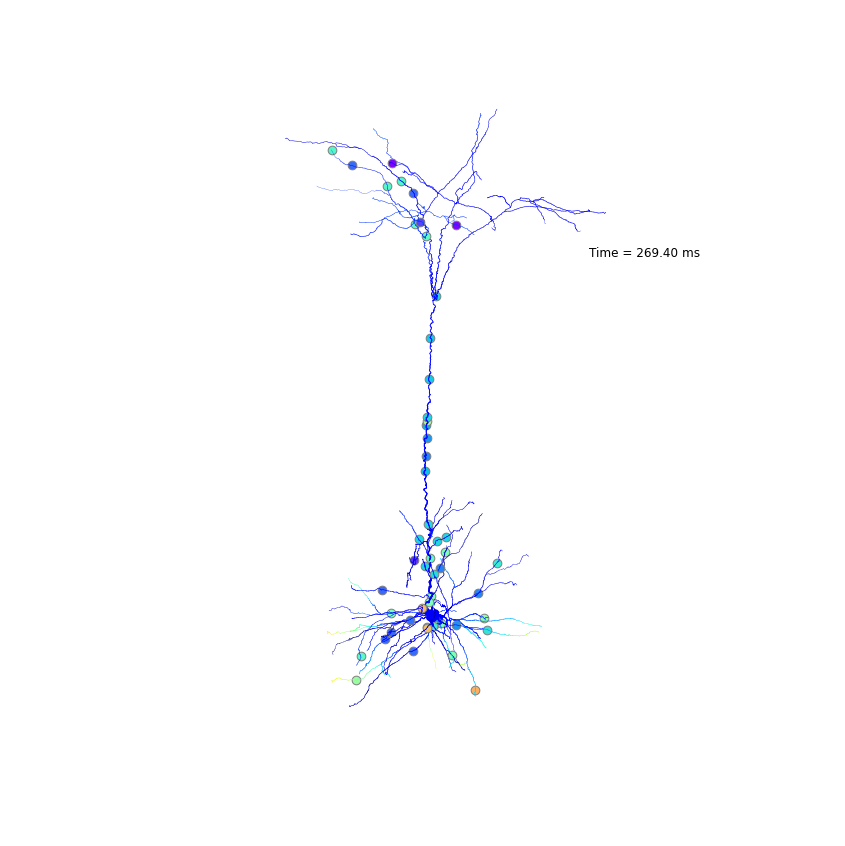
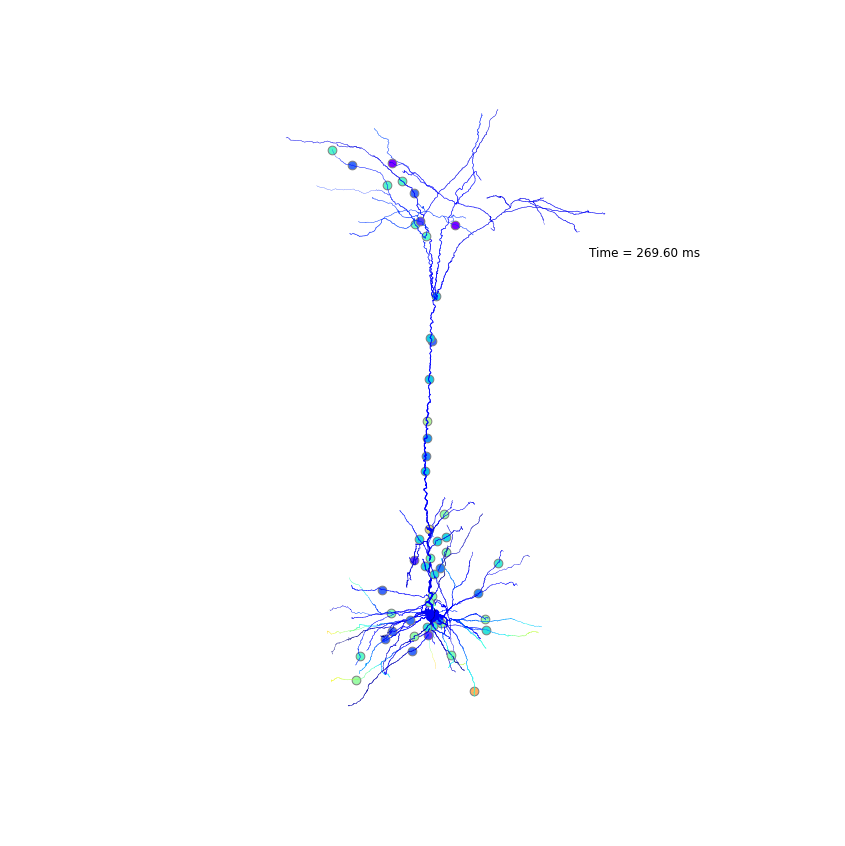
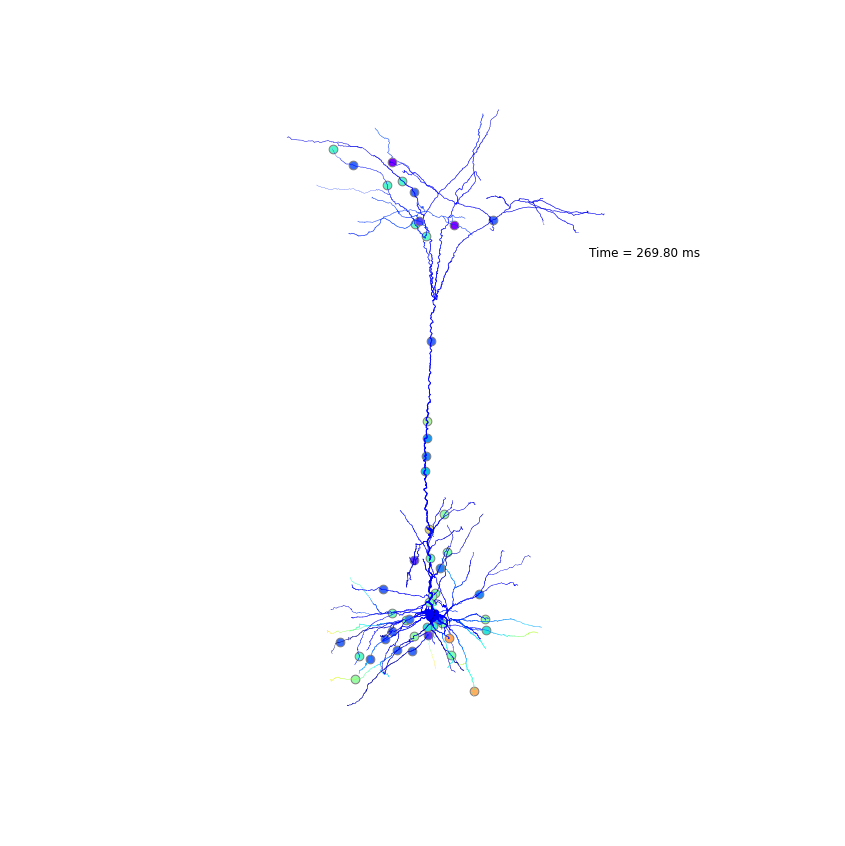
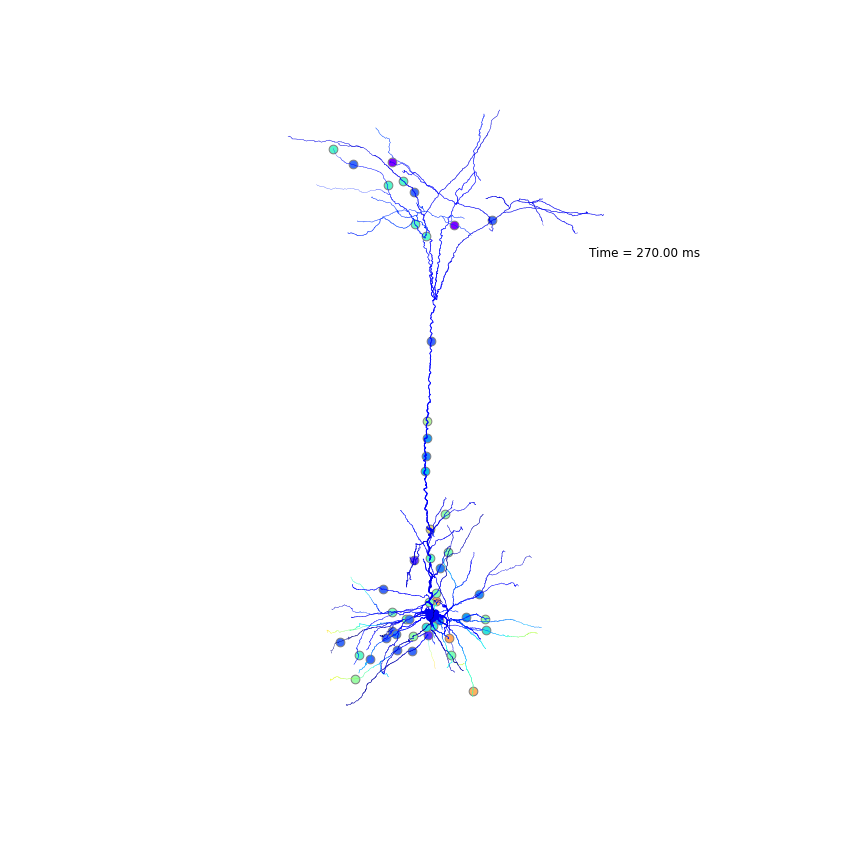

In [25]:
from matplotlib.pyplot import cm

sa = db["synapse_activation"]
unique_syn_types = I.np.unique(sa["synapse_type"])

cmv = I.CellMorphologyVisualizer(
    cell,
    t_start=245-25, 
    t_stop=245+25, 
    t_step=0.2
)

synapse_colors = cm.rainbow(range(len(unique_syn_types)))
cmv.population_to_color_dict = dict(zip(unique_syn_types, synapse_colors))

images_path = str(db._basedir / 'C2_stim_animation_3d')
cmv.animation(
    images_path=images_path, 
    color="voltage",
    show_synapses=True,
    client=dask_client,  # parallellize the creation of frames
);